# Models of Neurons Part 2

In [1]:
using Plots, Statistics
gr()

Plots.GRBackend()

In [2]:
function ref_LIFneuron(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
   
        t0=-20 # ms
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
            if i*dt<t0+refrac_period
            V[i] = Vreset
            else
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                t0 = i*dt
            end
        end
        end
       
    return V
end

ref_LIFneuron (generic function with 1 method)

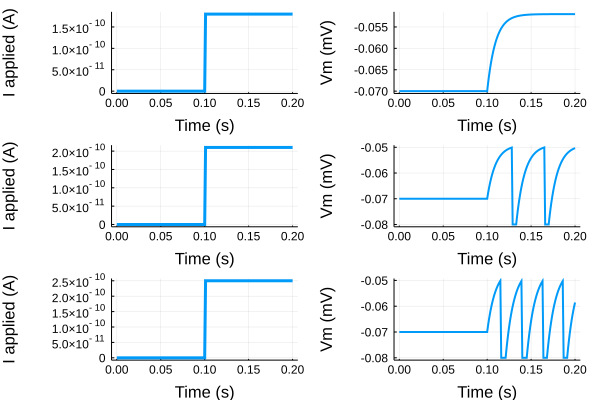

In [7]:
global Cm=100e-12  #F
global gl = 10e-9  #S
global El = -70e-3  #V
Vth = -50.0e-3 #mV
Vreset = -80.0e-3 #mV
V0=-70.0e-3 # V
# with these conditions taum = 10ms and Ith = 200 pA
refrac_period=5e-3 # in seconds
dt=1.0e-3
t=200.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = 0.0*ones(Int(t/dt)+1)
t_min =100.0e-3 
t_off=300.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=0.18e-9.*ones(length(I[idx]))



fig = plot(layout=(3,2),legend=false)
xlabel!("Time (s)")
ylabel!("Vm (mV)")

# low current
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[1], 0:dt:t,I,linewidth=3)
plot!(fig[2],0:dt:t,V,linewidth=2,label="I = 0.18 nA")
ylabel!(fig[1],"I applied (A)")

# medium current
I[idx]=0.21e-9.*ones(length(I[idx]))
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[4],0:dt:t,V,linewidth=2,label="I = 0.21 nA")
plot!(fig[3], 0:dt:t,I,linewidth=3)
ylabel!(fig[3],"I applied (A)")


# High current
I[idx]=0.25e-9.*ones(length(I[idx]))
V = ref_LIFneuron(t,dt,I,V0)
plot!(fig[6],0:dt:t,V,linewidth=2,label="I = 0.25 nA")
plot!(fig[5], 0:dt:t,I,linewidth=3)
ylabel!(fig[5],"I applied (A)")

fig

### Refractory conductance

In [8]:
function ref_conductance__LIFneuron(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
   
        t0=-20 # ms
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
          
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                t0 = i*dt
            end
        end
     
       
    return V
end

ref_conductance__LIFneuron (generic function with 1 method)

## Non Linear Models